# Capstone Project - San Francisco House Eviction Analysis

Importing all the necessary libariaries

In [1]:
import pandas as pd
import numpy as np
import json
import requests
import folium
from pandas.io.json import json_normalize
from IPython.display import HTML, display
from sklearn.cluster import KMeans
import matplotlib.cm as cm
import matplotlib.colors as colors

#### Histogram

In [2]:
df_SFeviction = pd.read_csv('SF_Eviction_Notices.csv')
df_SFeviction.head()

/Users/Stalwarts/opt/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3058: DtypeWarning: Columns (4,25) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,Eviction ID,Address,City,State,Eviction Notice Source Zipcode,File Date,Non Payment,Breach,Nuisance,Illegal Use,...,Roommate Same Unit,Other Cause,Late Payments,Lead Remediation,Development,Good Samaritan Ends,Constraints Date,Supervisor District,Neighborhoods - Analysis Boundaries,Location
0,M191809,700 Block Of Gonzalez Drive,San Francisco,CA,94132,07/29/2019,False,True,False,False,...,False,False,False,False,False,False,NaN,7.0,Lakeshore,POINT (-122.48059457480959 37.71751346803292)
1,M191803,700 Block Of Gonzalez Drive,San Francisco,CA,94132,07/29/2019,False,True,False,False,...,False,False,False,False,False,False,NaN,7.0,Lakeshore,POINT (-122.48066097526849 37.71741710510966)
2,M191805,800 Block Of Gonzalez Drive,San Francisco,CA,94132,07/29/2019,False,True,False,False,...,False,False,False,False,False,False,NaN,7.0,Lakeshore,POINT (-122.48059457480959 37.71751346803292)
3,M191790,300 Block Of Gonzalez Drive,San Francisco,CA,94132,07/29/2019,False,True,False,False,...,False,False,False,False,False,False,NaN,7.0,Lakeshore,POINT (-122.47657722541055 37.71621109111555)
4,M191824,600 Block Of Geary Street,San Francisco,CA,94102,07/29/2019,False,False,True,False,...,False,False,False,False,False,False,NaN,3.0,Tenderloin,POINT (-122.41399503430975 37.78667901466992)


Grouping the neighborhoods and counting the number of evictions per neighborhood

In [3]:
df = df_SFeviction.groupby('Neighborhoods - Analysis Boundaries', axis = 'rows').count()

df.reset_index('Neighborhoods - Analysis Boundaries', inplace=True)
df

,Neighborhoods - Analysis Boundaries,Eviction ID,Address,City,State,Eviction Notice Source Zipcode,File Date,Non Payment,Breach,Nuisance,...,Condo Conversion,Roommate Same Unit,Other Cause,Late Payments,Lead Remediation,Development,Good Samaritan Ends,Constraints Date,Supervisor District,Location
0,Bayview Hunters Point,1115,1115,1115,1115,1112,1115,1115,1115,1115,...,1115,1115,1115,1115,1115,1115,1115,112,1115,1115
1,Bernal Heights,1186,1186,1186,1186,1163,1186,1186,1186,1186,...,1186,1186,1186,1186,1186,1186,1186,195,1186,1186
2,Castro/Upper Market,1826,1826,1826,1826,1788,1826,1826,1826,1826,...,1826,1826,1826,1826,1826,1826,1826,177,1826,1826
3,Chinatown,434,434,434,434,432,434,434,434,434,...,434,434,434,434,434,434,434,9,434,434
4,Excelsior,1228,1228,1228,1228,1212,1228,1228,1228,1228,...,1228,1228,1228,1228,1228,1228,1228,186,1228,1228
5,Financial District/South Beach,251,251,251,251,249,251,251,251,251,...,251,251,251,251,251,251,251,5,251,251
6,Glen Park,267,267,267,267,264,267,267,267,267,...,267,267,267,267,267,267,267,52,267,267
7,Golden Gate Park,5,5,5,5,5,5,5,5,5,...,5,5,5,5,5,5,5,0,5,5
8,Haight Ashbury,1320,1320,1320,1320,1290,1320,1320,1320,1320,...,1320,1320,1320,1320,1320,1320,1320,140,1320,1320
9,Hayes Valley,1486,1486,1486,1486,1457,1486,1486,1486,1486,...,1486,1486,1486,1486,1486,1486,1486,97,1486,1486


Dropping and renaming columns to use relevant data for analysis

In [4]:
df.rename(columns={"Eviction ID": "Total Evictions","Neighborhoods - Analysis Boundaries":"Neighborhoods"}, inplace = True)
df.drop(['Address','City','State','Supervisor District','Eviction Notice Source Zipcode','File Date','Location','Non Payment','Breach','Nuisance','Illegal Use','Failure to Sign Renewal','Access Denial','Unapproved Subtenant','Owner Move In','Demolition','Capital Improvement','Substantial Rehab','Ellis Act WithDrawal','Condo Conversion','Roommate Same Unit','Other Cause','Late Payments','Lead Remediation','Development','Good Samaritan Ends','Constraints Date'], axis=1, inplace=True)
df

,Neighborhoods,Total Evictions
0,Bayview Hunters Point,1115
1,Bernal Heights,1186
2,Castro/Upper Market,1826
3,Chinatown,434
4,Excelsior,1228
5,Financial District/South Beach,251
6,Glen Park,267
7,Golden Gate Park,5
8,Haight Ashbury,1320
9,Hayes Valley,1486


In [5]:
# use the inline backend to generate the plots within the browser
%matplotlib inline 

import matplotlib as mpl
import matplotlib.pyplot as plt

mpl.style.use('ggplot') # optional: for ggplot-like style

# check for latest version of Matplotlib
print ('Matplotlib version: ', mpl.__version__) # >= 2.0.0

Matplotlib version:  3.1.1


Getting the bin ranges and frequency counts based on total evictions

In [6]:
# np.histogram returns 2 values
count, bin_edges = np.histogram(df['Total Evictions'])

print(count) # frequency count
print(bin_edges) # bin ranges, default = 10 bins

[12  9 11  4  2  2  0  0  0  1]
[   5.   447.8  890.6 1333.4 1776.2 2219.  2661.8 3104.6 3547.4 3990.2
 4433. ]


In the below plot, the x-axis represents the number of evictions in San Francisco from 1997 - 2019 in intervals of 442.8. The y-axis represents the frequency of evictions in each SF neighborhoods. 

The dotted line represents the average number of evictions in San Francisco

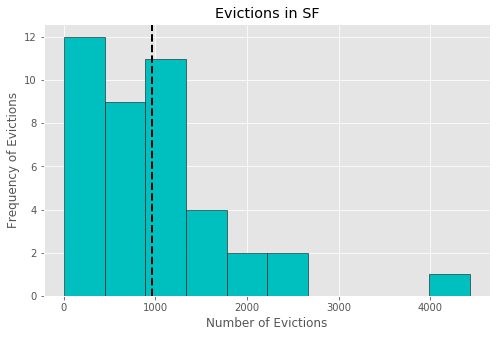

In [7]:
df['Total Evictions'].plot(kind='hist', color='c', edgecolor='k', figsize=(8, 5))

plt.title('Evictions in SF') # add a title to the histogram
plt.ylabel('Frequency of Evictions') # add y-label
plt.xlabel('Number of Evictions') # add x-label

plt.axvline(df['Total Evictions'].mean(), color='k', linestyle='dashed', linewidth=2)

plt.show()

#### Scatter Plot

In [8]:
df_SFeviction = pd.read_csv('SF_Eviction_Notices.csv')
df_SFeviction.head()

/Users/Stalwarts/opt/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3058: DtypeWarning: Columns (4,25) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,Eviction ID,Address,City,State,Eviction Notice Source Zipcode,File Date,Non Payment,Breach,Nuisance,Illegal Use,...,Roommate Same Unit,Other Cause,Late Payments,Lead Remediation,Development,Good Samaritan Ends,Constraints Date,Supervisor District,Neighborhoods - Analysis Boundaries,Location
0,M191809,700 Block Of Gonzalez Drive,San Francisco,CA,94132,07/29/2019,False,True,False,False,...,False,False,False,False,False,False,NaN,7.0,Lakeshore,POINT (-122.48059457480959 37.71751346803292)
1,M191803,700 Block Of Gonzalez Drive,San Francisco,CA,94132,07/29/2019,False,True,False,False,...,False,False,False,False,False,False,NaN,7.0,Lakeshore,POINT (-122.48066097526849 37.71741710510966)
2,M191805,800 Block Of Gonzalez Drive,San Francisco,CA,94132,07/29/2019,False,True,False,False,...,False,False,False,False,False,False,NaN,7.0,Lakeshore,POINT (-122.48059457480959 37.71751346803292)
3,M191790,300 Block Of Gonzalez Drive,San Francisco,CA,94132,07/29/2019,False,True,False,False,...,False,False,False,False,False,False,NaN,7.0,Lakeshore,POINT (-122.47657722541055 37.71621109111555)
4,M191824,600 Block Of Geary Street,San Francisco,CA,94102,07/29/2019,False,False,True,False,...,False,False,False,False,False,False,NaN,3.0,Tenderloin,POINT (-122.41399503430975 37.78667901466992)


Grouping by Supervisor District for futher analysis. 

In SF, areas are not classified as boroughs, instead it is called Supervisor Districts.

In [9]:
df_SD = df_SFeviction.groupby('Supervisor District', axis = 'rows').count()

df_SD.reset_index('Supervisor District', inplace=True)
df_SD

,Supervisor District,Eviction ID,Address,City,State,Eviction Notice Source Zipcode,File Date,Non Payment,Breach,Nuisance,...,Condo Conversion,Roommate Same Unit,Other Cause,Late Payments,Lead Remediation,Development,Good Samaritan Ends,Constraints Date,Neighborhoods - Analysis Boundaries,Location
0,1.0,3325,3325,3325,3325,3275,3325,3325,3325,3325,...,3325,3325,3325,3325,3325,3325,3325,539,3325,3325
1,2.0,3314,3314,3314,3314,3255,3314,3314,3314,3314,...,3314,3314,3314,3314,3314,3314,3314,332,3314,3314
2,3.0,3734,3734,3733,3733,3675,3734,3734,3734,3734,...,3734,3734,3734,3734,3734,3734,3734,176,3734,3734
3,4.0,2571,2571,2571,2571,2531,2571,2571,2571,2571,...,2571,2571,2571,2571,2571,2571,2571,472,2571,2571
4,5.0,4642,4642,4642,4642,4532,4642,4642,4642,4642,...,4642,4642,4642,4642,4642,4642,4642,412,4642,4642
5,6.0,4182,4182,4182,4181,4147,4182,4182,4182,4182,...,4182,4182,4182,4182,4182,4182,4182,30,4182,4182
6,7.0,3290,3290,3290,3290,3271,3290,3290,3290,3290,...,3290,3290,3290,3290,3290,3290,3290,271,3290,3290
7,8.0,5230,5230,5229,5230,5123,5230,5230,5230,5230,...,5230,5230,5230,5230,5230,5230,5230,591,5230,5230
8,9.0,4570,4570,4570,4570,4483,4570,4570,4570,4570,...,4570,4570,4570,4570,4570,4570,4570,569,4570,4570
9,10.0,2367,2367,2367,2367,2348,2367,2367,2367,2367,...,2367,2367,2367,2367,2367,2367,2367,304,2367,2367


Dataframe containing total evictions per Supervisor District or Borough

In [10]:
df_SD.rename(columns={"Eviction ID": "Total Evictions"}, inplace = True)
df_SD.drop(['Address','City','State','Neighborhoods - Analysis Boundaries','Eviction Notice Source Zipcode','File Date','Location','Non Payment','Breach','Nuisance','Illegal Use','Failure to Sign Renewal','Access Denial','Unapproved Subtenant','Owner Move In','Demolition','Capital Improvement','Substantial Rehab','Ellis Act WithDrawal','Condo Conversion','Roommate Same Unit','Other Cause','Late Payments','Lead Remediation','Development','Good Samaritan Ends','Constraints Date'], axis=1, inplace=True)
df_SD

,Supervisor District,Total Evictions
0,1.0,3325
1,2.0,3314
2,3.0,3734
3,4.0,2571
4,5.0,4642
5,6.0,4182
6,7.0,3290
7,8.0,5230
8,9.0,4570
9,10.0,2367


Creating a scatter plot with y-axis as Number of evictions and x-axis as Supervisor District

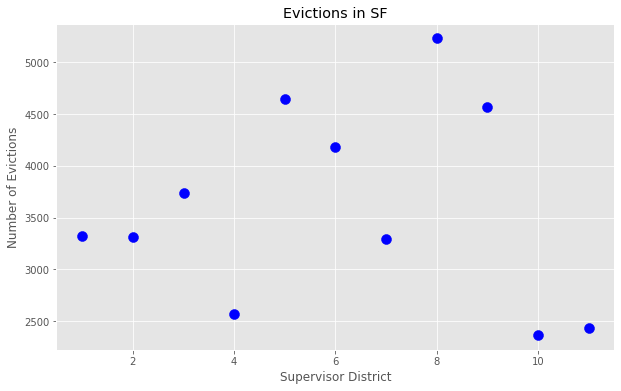

In [11]:
df_SD.plot(kind='scatter', x="Supervisor District",y="Total Evictions", figsize=(10, 6), color='blue', s = 100)

plt.title('Evictions in SF')
plt.xlabel('Supervisor District')
plt.ylabel('Number of Evictions')

plt.show()

Calculating the equation of line of best fit

In [12]:
x = df_SD['Supervisor District']      # year on x-axis
y = df_SD['Total Evictions']     # total on y-axis
fit = np.polyfit(x, y, deg=1)

fit

array([ -16.26363636, 3702.58181818])

Plotting the regression line on the `scatter plot`.

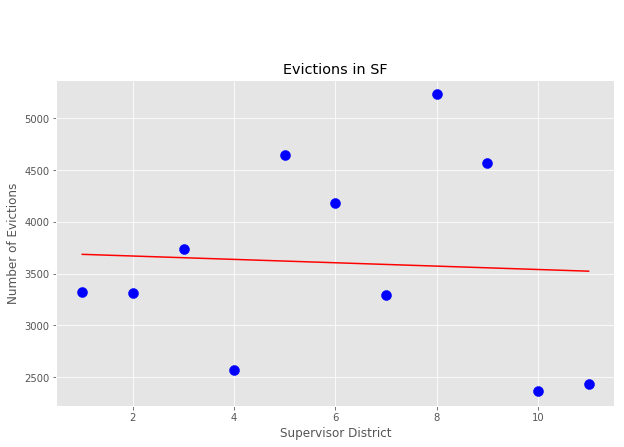

In [13]:
df_SD.plot(kind='scatter', x="Supervisor District",y="Total Evictions", figsize=(10, 6), color='blue', s = 100)

plt.title('Evictions in SF')
plt.xlabel('Supervisor District')
plt.ylabel('Number of Evictions')


# plot line of best fit
plt.plot(x, fit[0] * x + fit[1], color='red') # recall that x is the Years
plt.annotate('y={0:.0f} x + {1:.0f}'.format(fit[0], fit[1]), xy=(10, 6000))

plt.show()


The best fit line has a negative slope.

The equation of the line is:

Number of Evictions = -16.26363636 * Supervisor District + 3702.58181818
    

#### Choropleth Map

In [14]:
df_SFevict = pd.read_csv('SF_Eviction_Notices.csv')
df_SFevict.head()

,Eviction ID,Address,City,State,Eviction Notice Source Zipcode,File Date,Non Payment,Breach,Nuisance,Illegal Use,...,Roommate Same Unit,Other Cause,Late Payments,Lead Remediation,Development,Good Samaritan Ends,Constraints Date,Supervisor District,Neighborhoods - Analysis Boundaries,Location
0,M191809,700 Block Of Gonzalez Drive,San Francisco,CA,94132,07/29/2019,False,True,False,False,...,False,False,False,False,False,False,NaN,7.0,Lakeshore,POINT (-122.48059457480959 37.71751346803292)
1,M191803,700 Block Of Gonzalez Drive,San Francisco,CA,94132,07/29/2019,False,True,False,False,...,False,False,False,False,False,False,NaN,7.0,Lakeshore,POINT (-122.48066097526849 37.71741710510966)
2,M191805,800 Block Of Gonzalez Drive,San Francisco,CA,94132,07/29/2019,False,True,False,False,...,False,False,False,False,False,False,NaN,7.0,Lakeshore,POINT (-122.48059457480959 37.71751346803292)
3,M191790,300 Block Of Gonzalez Drive,San Francisco,CA,94132,07/29/2019,False,True,False,False,...,False,False,False,False,False,False,NaN,7.0,Lakeshore,POINT (-122.47657722541055 37.71621109111555)
4,M191824,600 Block Of Geary Street,San Francisco,CA,94102,07/29/2019,False,False,True,False,...,False,False,False,False,False,False,NaN,3.0,Tenderloin,POINT (-122.41399503430975 37.78667901466992)


Grouping by Supervisor District/Boroughs for futher analysis

In [15]:
df_neigh = df_SFevict.groupby('Supervisor District', axis = 'rows').count()
df_neigh.reset_index('Supervisor District', inplace=True)
df_neigh

,Supervisor District,Eviction ID,Address,City,State,Eviction Notice Source Zipcode,File Date,Non Payment,Breach,Nuisance,...,Condo Conversion,Roommate Same Unit,Other Cause,Late Payments,Lead Remediation,Development,Good Samaritan Ends,Constraints Date,Neighborhoods - Analysis Boundaries,Location
0,1.0,3325,3325,3325,3325,3275,3325,3325,3325,3325,...,3325,3325,3325,3325,3325,3325,3325,539,3325,3325
1,2.0,3314,3314,3314,3314,3255,3314,3314,3314,3314,...,3314,3314,3314,3314,3314,3314,3314,332,3314,3314
2,3.0,3734,3734,3733,3733,3675,3734,3734,3734,3734,...,3734,3734,3734,3734,3734,3734,3734,176,3734,3734
3,4.0,2571,2571,2571,2571,2531,2571,2571,2571,2571,...,2571,2571,2571,2571,2571,2571,2571,472,2571,2571
4,5.0,4642,4642,4642,4642,4532,4642,4642,4642,4642,...,4642,4642,4642,4642,4642,4642,4642,412,4642,4642
5,6.0,4182,4182,4182,4181,4147,4182,4182,4182,4182,...,4182,4182,4182,4182,4182,4182,4182,30,4182,4182
6,7.0,3290,3290,3290,3290,3271,3290,3290,3290,3290,...,3290,3290,3290,3290,3290,3290,3290,271,3290,3290
7,8.0,5230,5230,5229,5230,5123,5230,5230,5230,5230,...,5230,5230,5230,5230,5230,5230,5230,591,5230,5230
8,9.0,4570,4570,4570,4570,4483,4570,4570,4570,4570,...,4570,4570,4570,4570,4570,4570,4570,569,4570,4570
9,10.0,2367,2367,2367,2367,2348,2367,2367,2367,2367,...,2367,2367,2367,2367,2367,2367,2367,304,2367,2367


In [16]:
df_neigh.drop(['Non Payment','Breach','Nuisance','Illegal Use','Failure to Sign Renewal','Access Denial','Unapproved Subtenant','Owner Move In','Demolition','Capital Improvement','Substantial Rehab','Ellis Act WithDrawal','Condo Conversion','Roommate Same Unit','Other Cause','Late Payments','Lead Remediation','Development','Good Samaritan Ends','Constraints Date'], axis=1, inplace=True)

In [17]:
df_neigh.shape

(11, 9)

Using the GeoJSON file for San Francisco

In [18]:
!wget --quiet https://cocl.us/sanfran_geojson -O san-francisco.geojson

gjson=r'san-francisco.geojson'
print('GeoJSON file downloaded!')


/bin/sh: wget: command not found
GeoJSON file downloaded!


In [19]:
sanfan_geo = r'san-francisco.geojson' # geojson file


sanfan_map = folium.Map(location=[37.77, -122.42], zoom_start=11.2)

Choropleth Map displaying the number of evictions per Supervisor District.

Higher the number of evictions in a Supervisor District, darker the color in the map.

In [20]:
sanfan_map.choropleth(
    geo_data=sanfan_geo,
    data=df_neigh,
    columns=['Supervisor District','Location'],
    key_on='feature.properties.OBJECTID',
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Evictions in San Francisco')

# display map
sanfan_map

### Segmenting and Clustering

Installing geopy to get latitude and longitude coordinate details

In [21]:
!conda install -c conda-forge geopy --yes
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

Solving environment: done

# All requested packages already installed.



Installing Folium to display maps of neighborhoods and clusters

In [22]:
!conda install -c conda-forge folium=0.5.0 --yes

Solving environment: done

# All requested packages already installed.



#### Data Processing

In [23]:
df_SF = pd.read_csv('SF_Eviction_Notices.csv')

In [24]:
df_SFeviction = df_SF.dropna(subset = ["Location"])

In [25]:
df_SFeviction.head(20)

,Eviction ID,Address,City,State,Eviction Notice Source Zipcode,File Date,Non Payment,Breach,Nuisance,Illegal Use,...,Roommate Same Unit,Other Cause,Late Payments,Lead Remediation,Development,Good Samaritan Ends,Constraints Date,Supervisor District,Neighborhoods - Analysis Boundaries,Location
0,M191809,700 Block Of Gonzalez Drive,San Francisco,CA,94132,07/29/2019,False,True,False,False,...,False,False,False,False,False,False,NaN,7.0,Lakeshore,POINT (-122.48059457480959 37.71751346803292)
1,M191803,700 Block Of Gonzalez Drive,San Francisco,CA,94132,07/29/2019,False,True,False,False,...,False,False,False,False,False,False,NaN,7.0,Lakeshore,POINT (-122.48066097526849 37.71741710510966)
2,M191805,800 Block Of Gonzalez Drive,San Francisco,CA,94132,07/29/2019,False,True,False,False,...,False,False,False,False,False,False,NaN,7.0,Lakeshore,POINT (-122.48059457480959 37.71751346803292)
3,M191790,300 Block Of Gonzalez Drive,San Francisco,CA,94132,07/29/2019,False,True,False,False,...,False,False,False,False,False,False,NaN,7.0,Lakeshore,POINT (-122.47657722541055 37.71621109111555)
4,M191824,600 Block Of Geary Street,San Francisco,CA,94102,07/29/2019,False,False,True,False,...,False,False,False,False,False,False,NaN,3.0,Tenderloin,POINT (-122.41399503430975 37.78667901466992)
5,M191789,500 Block Of Vidal Drive,San Francisco,CA,94132,07/29/2019,False,True,False,False,...,False,False,False,False,False,False,NaN,7.0,Lakeshore,POINT (-122.48403138269013 37.715668466094236)
6,M191804,400 Block Of Serrano Drive,San Francisco,CA,94132,07/29/2019,False,True,False,False,...,False,False,False,False,False,False,NaN,7.0,Lakeshore,POINT (-122.48045074948287 37.71901186772143)
7,M191795,100 Block Of Font Boulevard,San Francisco,CA,94132,07/29/2019,False,True,False,False,...,False,False,False,False,False,False,NaN,7.0,Lakeshore,POINT (-122.47362991995713 37.71554505295899)
8,M191808,300 Block Of Arballo Drive,San Francisco,CA,94132,07/29/2019,False,True,False,False,...,False,False,False,False,False,False,NaN,7.0,Lakeshore,POINT (-122.48306644173614 37.72083184136464)
9,M191792,700 Block Of Gonzalez Drive,San Francisco,CA,94132,07/29/2019,False,True,False,False,...,False,False,False,False,False,False,NaN,7.0,Lakeshore,POINT (-122.48066097526849 37.71741710510966)


Data in the column "Location" should be split into Longitute and Latititude coordinates

In [26]:
# Spliting coordinates to Longitute and Latititude

Lat = []
Long = []
for i in df_SFeviction['Location']:
    lst = i.split()
    Longitude = float(lst[1][1:])
    Latitude = float(lst[2][:-1])
    Lat.append(Latitude)
    Long.append(Longitude)

In [27]:
df_SFeviction['Latitude'] = Lat 
df_SFeviction['Longitude'] = Long

/Users/Stalwarts/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/Users/Stalwarts/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [28]:
df_SFeviction.shape

(39667, 31)

Dropping and renaming columns

In [29]:
df_SFeviction.drop(['Eviction ID','Address','City','State','File Date','Non Payment','Breach','Nuisance','Illegal Use','Failure to Sign Renewal','Access Denial','Unapproved Subtenant','Owner Move In','Demolition','Capital Improvement','Substantial Rehab','Ellis Act WithDrawal','Condo Conversion','Roommate Same Unit','Other Cause','Late Payments','Lead Remediation','Development','Good Samaritan Ends','Constraints Date','Location'], axis=1, inplace=True)
df_SFeviction.rename(columns={"Eviction Notice Source Zipcode": "PostalCode","Supervisor District": "Supervisor District/Burough","Neighborhoods - Analysis Boundaries":"Neighborhood"}, inplace = True)

/Users/Stalwarts/opt/anaconda3/lib/python3.7/site-packages/pandas/core/frame.py:4102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/Stalwarts/opt/anaconda3/lib/python3.7/site-packages/pandas/core/frame.py:4223: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().rename(**kwargs)


In [30]:
df_SFeviction = df_SFeviction.dropna()

In [31]:
df_SFeviction = df_SFeviction.drop_duplicates()

In [32]:
df_SFeviction.shape

(12912, 5)

#### Explore and cluster the neighborhoods in San Francisco

#### Use geopy library to get the latitude and longitude values of San Francisco City.

In [33]:
address = 'San Francisco, California'

geolocator = Nominatim(user_agent="sf_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of San Francisco City are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of San Francisco City are 37.7790262, -122.4199061.


#### Map of San Francisco with neighborhoods superimposed on top.

In [34]:
# create map of San Francisco using latitude and longitude values
map_SF = folium.Map(location=[latitude, longitude], zoom_start=12)

# add markers to map
for lat, lng, borough, neighborhood in zip(df_SFeviction['Latitude'], df_SFeviction['Longitude'], df_SFeviction['Supervisor District/Burough'], df_SFeviction['Neighborhood']):
    label = '{}, {}'.format(neighborhood, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=1,
        popup=label,
        color='orange',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_SF)  
    
map_SF

#### San Francisco County selected for further analysis

SF Supervisor District 2.0 is San Francisco County

Random 50 samples from the data set selected for further processing

In [35]:
SF_dat = df_SFeviction[df_SFeviction["Supervisor District/Burough"] == 2.0].reset_index(drop=True)
SF_data = SF_dat.sample(n=50).reset_index(drop=True)
SF_data

,PostalCode,Supervisor District/Burough,Neighborhood,Latitude,Longitude
0,94123,2.0,Marina,37.799100,-122.445999
1,94115,2.0,Pacific Heights,37.793048,-122.430455
2,94115,2.0,Marina,37.796919,-122.440584
3,94115,2.0,Pacific Heights,37.791750,-122.433571
4,94123,2.0,Marina,37.798793,-122.436679
5,94115,2.0,Pacific Heights,37.788856,-122.434674
6,94115,2.0,Presidio Heights,37.787296,-122.446087
7,94109,2.0,Pacific Heights,37.789465,-122.425588
8,94118,2.0,Presidio Heights,37.790558,-122.450022
9,94123,2.0,Marina,37.795594,-122.432659


#### Use geopy library to get the latitude and longitude values of San Francisco County.

In [36]:
address = 'San Francisco, California'

geolocator = Nominatim(user_agent="sf_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of San Francisco County, CA are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of San Francisco County, CA are 37.7790262, -122.4199061.


#### Map of San Francisco County with neighborhoods superimposed on top.

In [37]:
# create map of San Francisco county, CA using latitude and longitude values
map_SFcounty = folium.Map(location=[latitude, longitude], zoom_start=12.3)

# add markers to map
for lat, lng, borough, neighborhood in zip(SF_data['Latitude'], SF_data['Longitude'], SF_data['Supervisor District/Burough'], SF_data['Neighborhood']):
    label = '{}, {}'.format(neighborhood, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=8,
        popup=label,
        color='cyan',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_SFcounty)  
    
map_SFcounty

#### Define Foursquare Credentials and Version

In [38]:
CLIENT_ID = 'JWCGCESJQ3BMN2KB0B3ESOQFFTCZXUEB2PRJDPLTVRCRB2RV' # your Foursquare ID
CLIENT_SECRET = 'SC02ISR23H2AR0LDFJSJNVPPDAV21CZWYLZ2J3HSSA44KTRM' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: JWCGCESJQ3BMN2KB0B3ESOQFFTCZXUEB2PRJDPLTVRCRB2RV
CLIENT_SECRET:SC02ISR23H2AR0LDFJSJNVPPDAV21CZWYLZ2J3HSSA44KTRM


##### Details of the fifth neighborhood

In [39]:
SF_data.loc[4, 'Neighborhood']

'Marina'

###### Coordinates of fifth neighborhood

In [40]:
neighborhood_latitude = SF_data.loc[4, 'Latitude'] # neighborhood latitude value
neighborhood_longitude = SF_data.loc[4, 'Longitude'] # neighborhood longitude value

neighborhood_name = SF_data.loc[4, 'Neighborhood'] # neighborhood name

print('Latitude and longitude values of {} are {}, {}.'.format(neighborhood_name, 
                                                               neighborhood_latitude, 
                                                               neighborhood_longitude))

Latitude and longitude values of Marina are 37.798792796808684, -122.43667938503967.


#### Top 100 venues that are in fifth neighborhood within a radius of 500 meters.

In [41]:
LIMIT = 100 # limit of number of venues returned by Foursquare API

radius = 500 # define radius

# create URL
url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
    CLIENT_ID, 
    CLIENT_SECRET, 
    VERSION, 
    neighborhood_latitude, 
    neighborhood_longitude, 
    radius, 
    LIMIT)
url # display URL

'https://api.foursquare.com/v2/venues/explore?&client_id=JWCGCESJQ3BMN2KB0B3ESOQFFTCZXUEB2PRJDPLTVRCRB2RV&client_secret=SC02ISR23H2AR0LDFJSJNVPPDAV21CZWYLZ2J3HSSA44KTRM&v=20180605&ll=37.798792796808684,-122.43667938503967&radius=500&limit=100'

Send the GET request and examine the resutls

In [42]:
results = requests.get('https://api.foursquare.com/v2/venues/explore?&client_id=JWCGCESJQ3BMN2KB0B3ESOQFFTCZXUEB2PRJDPLTVRCRB2RV&client_secret=SC02ISR23H2AR0LDFJSJNVPPDAV21CZWYLZ2J3HSSA44KTRM&v=20180605&ll=37.80128608407555,-122.43212352679282&radius=500&limit=100').json()
results

{'meta': {'code': 200, 'requestId': '5f3f606fd1432a1e2f9e6b81'},
 'response': {'suggestedFilters': {'header': 'Tap to show:',
   'filters': [{'name': '$-$$$$', 'key': 'price'},
    {'name': 'Open now', 'key': 'openNow'}]},
  'headerLocation': 'Marina District',
  'headerFullLocation': 'Marina District, San Francisco',
  'headerLocationGranularity': 'neighborhood',
  'totalResults': 74,
  'suggestedBounds': {'ne': {'lat': 37.80578608857555,
    'lng': -122.42643897045504},
   'sw': {'lat': 37.79678607957555, 'lng': -122.4378080831306}},
  'groups': [{'type': 'Recommended Places',
    'name': 'recommended',
    'items': [{'reasons': {'count': 0,
       'items': [{'summary': 'This spot is popular',
         'type': 'general',
         'reasonName': 'globalInteractionReason'}]},
      'venue': {'id': '53911b18498e3a275a980431',
       'name': 'Reboot Float Spa',
       'location': {'address': '1912 Lombard St',
        'crossStreet': 'Buchanan',
        'lat': 37.80031278530782,
        'l

In [43]:
# function that extracts the category of the venue
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

Create dataframe using the JSON

In [44]:
venues = results['response']['groups'][0]['items']
    
nearby_venues = json_normalize(venues) # flatten JSON

# filter columns
filtered_columns = ['venue.name', 'venue.categories', 'venue.location.lat', 'venue.location.lng']
nearby_venues =nearby_venues.loc[:, filtered_columns]

# filter the category for each row
nearby_venues['venue.categories'] = nearby_venues.apply(get_category_type, axis=1)

# clean columns
nearby_venues.columns = [col.split(".")[-1] for col in nearby_venues.columns]

nearby_venues.head()

,name,categories,lat,lng
0,Reboot Float Spa,Spa,37.800313,-122.433160
1,The Brazen Head,Steakhouse,37.799267,-122.432360
2,George R. Moscone Park Dog Run,Dog Run,37.801443,-122.432510
3,Zushi Puzzle,Sushi Restaurant,37.800288,-122.433093
4,Marina Green Running Trail,Track,37.803514,-122.431012


In [45]:
print('{} venues were returned by Foursquare.'.format(nearby_venues.shape[0]))

74 venues were returned by Foursquare.


### Explore Neighborhoods in San Francisco county (Borough)

In [46]:
def getNearbyVenues(names, latitudes, longitudes, radius=500, LIMIT = 50):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

#### Finding venues in San Francisco county

In [47]:
SF_County_venues = getNearbyVenues(names=SF_data['Neighborhood'],
                                   latitudes=SF_data['Latitude'],
                                   longitudes=SF_data['Longitude']
                                  )

Marina
Pacific Heights
Marina
Pacific Heights
Marina
Pacific Heights
Presidio Heights
Pacific Heights
Presidio Heights
Marina
Marina
Pacific Heights
Pacific Heights
Seacliff
Presidio Heights
Pacific Heights
Marina
Marina
Marina
Pacific Heights
Western Addition
Marina
Marina
Pacific Heights
Pacific Heights
Russian Hill
Pacific Heights
Pacific Heights
Pacific Heights
Russian Hill
Marina
Presidio Heights
Presidio Heights
Marina
Pacific Heights
Presidio Heights
Marina
Pacific Heights
Inner Richmond
Marina
Russian Hill
Pacific Heights
Marina
Marina
Inner Richmond
Presidio Heights
Russian Hill
Marina
Pacific Heights
Marina


In [48]:
print(SF_County_venues.shape)
SF_County_venues.head()

(2139, 7)


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Marina,37.7991,-122.445999,Sessions at the Presidio,37.799154,-122.447889,New American Restaurant
1,Marina,37.7991,-122.445999,Presidio Pond,37.800303,-122.448587,Park
2,Marina,37.7991,-122.445999,Cow Hollow Playground & Clubhouse,37.797281,-122.444950,Playground
3,Marina,37.7991,-122.445999,Letterman Digital Arts Center,37.799408,-122.449515,Office
4,Marina,37.7991,-122.445999,Presidio YMCA Letterman Pool,37.801227,-122.448649,Pool


In [49]:
SF_County_venues.groupby('Neighborhood').count().reset_index()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Inner Richmond,51,51,51,51,51,51
1,Marina,783,783,783,783,783,783
2,Pacific Heights,764,764,764,764,764,764
3,Presidio Heights,301,301,301,301,301,301
4,Russian Hill,186,186,186,186,186,186
5,Seacliff,4,4,4,4,4,4
6,Western Addition,50,50,50,50,50,50


##### Unique categories curated from all the returned venues

In [50]:
print('There are {} uniques categories.'.format(len(SF_County_venues['Venue Category'].unique())))

There are 202 uniques categories.


### Analyze Each Neighborhood in San Francisco county

In [51]:
# one hot encoding
SF_County_onehot = pd.get_dummies(SF_County_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
SF_County_onehot['Neighborhood'] = SF_County_venues['Neighborhood'] 

# move neighborhood column to the first column
fixed_columns = [SF_County_onehot.columns[-1]] + list(SF_County_onehot.columns[:-1])
SF_County_onehot = SF_County_onehot[fixed_columns]

SF_County_onehot.head()

,Yoga Studio,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Alternative Healer,American Restaurant,Animal Shelter,Antique Shop,Art Gallery,...,Track,Trade School,Trail,Tunnel,Turkish Restaurant,Vegetarian / Vegan Restaurant,Vietnamese Restaurant,Wine Bar,Wine Shop,Winery
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [52]:
SF_County_onehot.shape

(2139, 202)

#### Grouping rows by neighborhood and by taking the mean of the frequency of occurrence of each category

In [53]:
SF_County_grouped = SF_County_onehot.groupby('Neighborhood').mean().reset_index()
SF_County_grouped

,Neighborhood,Yoga Studio,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Alternative Healer,American Restaurant,Animal Shelter,Antique Shop,...,Track,Trade School,Trail,Tunnel,Turkish Restaurant,Vegetarian / Vegan Restaurant,Vietnamese Restaurant,Wine Bar,Wine Shop,Winery
0,Inner Richmond,0.039216,0.000000,0.000000,0.00,0.000000,0.000000,0.058824,0.000000,0.000000,...,0.000000,0.000000,0.019608,0.000000,0.000000,0.019608,0.039216,0.019608,0.039216,0.000000
1,Marina,0.016603,0.006386,0.000000,0.00,0.001277,0.007663,0.025543,0.000000,0.000000,...,0.001277,0.000000,0.002554,0.000000,0.000000,0.012771,0.002554,0.030651,0.007663,0.000000
2,Pacific Heights,0.019634,0.000000,0.003927,0.00,0.003927,0.000000,0.015707,0.000000,0.000000,...,0.000000,0.000000,0.010471,0.000000,0.000000,0.000000,0.023560,0.019634,0.015707,0.000000
3,Presidio Heights,0.013289,0.003322,0.000000,0.00,0.000000,0.000000,0.046512,0.006645,0.009967,...,0.000000,0.000000,0.006645,0.003322,0.003322,0.003322,0.009967,0.016611,0.013289,0.000000
4,Russian Hill,0.010753,0.000000,0.000000,0.00,0.005376,0.000000,0.010753,0.000000,0.000000,...,0.000000,0.016129,0.005376,0.000000,0.000000,0.000000,0.000000,0.043011,0.021505,0.005376
5,Seacliff,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.250000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,Western Addition,0.020000,0.000000,0.000000,0.02,0.000000,0.000000,0.020000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.020000,0.020000,0.000000


In [54]:
SF_County_grouped.shape

(7, 202)

##### Top 5 most common venues in each neighborhood

In [55]:
num_top_venues = 5

for hood in SF_County_grouped['Neighborhood']:
    print("----"+hood+"----")
    temp = SF_County_grouped[SF_County_grouped['Neighborhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----Inner Richmond----
                 venue  freq
0          Golf Course  0.10
1   Burmese Restaurant  0.08
2     Sushi Restaurant  0.06
3  American Restaurant  0.06
4          Yoga Studio  0.04


----Marina----
                venue  freq
0  Italian Restaurant  0.06
1                 Spa  0.03
2      Cosmetics Shop  0.03
3            Wine Bar  0.03
4       Deli / Bodega  0.03


----Pacific Heights----
            venue  freq
0  Cosmetics Shop  0.04
1            Park  0.04
2          Bakery  0.03
3  Sandwich Place  0.02
4   Deli / Bodega  0.02


----Presidio Heights----
                    venue  freq
0     American Restaurant  0.05
1          Cosmetics Shop  0.04
2  Furniture / Home Store  0.04
3             Coffee Shop  0.03
4                  Bakery  0.03


----Russian Hill----
                venue  freq
0    Sushi Restaurant  0.05
1  Italian Restaurant  0.05
2                Park  0.05
3         Coffee Shop  0.04
4            Wine Bar  0.04


----Seacliff----
                   

In [56]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

#### Dataframe to display top 10 venues in each neighborhood in San Francisco county

In [57]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighborhood'] = SF_County_grouped['Neighborhood']

for ind in np.arange(SF_County_grouped.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(SF_County_grouped.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Inner Richmond,Golf Course,Burmese Restaurant,American Restaurant,Sushi Restaurant,Wine Shop,Coffee Shop,Café,Bakery,Yoga Studio,Vietnamese Restaurant
1,Marina,Italian Restaurant,French Restaurant,Gym / Fitness Center,Wine Bar,Spa,Gym,Cosmetics Shop,Park,American Restaurant,Coffee Shop
2,Pacific Heights,Cosmetics Shop,Park,Bakery,Salon / Barbershop,Gym / Fitness Center,Italian Restaurant,Vietnamese Restaurant,Sushi Restaurant,Café,Sandwich Place
3,Presidio Heights,American Restaurant,Furniture / Home Store,Cosmetics Shop,Coffee Shop,Bakery,New American Restaurant,Gym / Fitness Center,Gym,Bank,Italian Restaurant
4,Russian Hill,Sushi Restaurant,Park,Italian Restaurant,Wine Bar,Coffee Shop,Pizza Place,Spa,Bar,Tennis Court,Plaza


### Clustering the neighborhood
Create 5 clusters of neighborhoods in San Francisco county.


Run k-means to cluster the neighborhood into 5 clusters.

In [58]:
# set number of clusters
kclusters = 5

SF_County_grouped_clustering = SF_County_grouped.drop('Neighborhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(SF_County_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10] 

array([3, 4, 4, 4, 0, 1, 2], dtype=int32)

Dataframe containing clusters and top 10 venues in each neighborhood

In [59]:
# add clustering labels
neighborhoods_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

SF_County_merged = SF_data

# merge toronto_grouped with toronto_data to add latitude/longitude for each neighborhood
SF_County_merged = SF_County_merged.join(neighborhoods_venues_sorted.set_index('Neighborhood'), on='Neighborhood')
#SF_County_merged.drop(['Non Payment','Breach','Nuisance','Illegal Use','Failure to Sign Renewal','Access Denial','Unapproved Subtenant'], axis=1, inplace=True)
SF_County_merged.head() # check the last columns!

,PostalCode,Supervisor District/Burough,Neighborhood,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,94123,2.0,Marina,37.799100,-122.445999,4,Italian Restaurant,French Restaurant,Gym / Fitness Center,Wine Bar,Spa,Gym,Cosmetics Shop,Park,American Restaurant,Coffee Shop
1,94115,2.0,Pacific Heights,37.793048,-122.430455,4,Cosmetics Shop,Park,Bakery,Salon / Barbershop,Gym / Fitness Center,Italian Restaurant,Vietnamese Restaurant,Sushi Restaurant,Café,Sandwich Place
2,94115,2.0,Marina,37.796919,-122.440584,4,Italian Restaurant,French Restaurant,Gym / Fitness Center,Wine Bar,Spa,Gym,Cosmetics Shop,Park,American Restaurant,Coffee Shop
3,94115,2.0,Pacific Heights,37.791750,-122.433571,4,Cosmetics Shop,Park,Bakery,Salon / Barbershop,Gym / Fitness Center,Italian Restaurant,Vietnamese Restaurant,Sushi Restaurant,Café,Sandwich Place
4,94123,2.0,Marina,37.798793,-122.436679,4,Italian Restaurant,French Restaurant,Gym / Fitness Center,Wine Bar,Spa,Gym,Cosmetics Shop,Park,American Restaurant,Coffee Shop


#### Creating map to visualize clusters

In [60]:
# create map
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=12)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(SF_County_merged['Latitude'], SF_County_merged['Longitude'], SF_County_merged['Neighborhood'], SF_County_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

## Examinig Clusters
Determining the discriminating venue categories that distinguish each cluster.

#### Restaurant Cluster

Common venues in this cluster as per the findings are Restaurants

In [61]:
SF_County_merged.loc[SF_County_merged['Cluster Labels'] == 0, SF_County_merged.columns[[2] + list(range(5, SF_County_merged.shape[1]))]]

,Neighborhood,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
25,Russian Hill,0,Sushi Restaurant,Park,Italian Restaurant,Wine Bar,Coffee Shop,Pizza Place,Spa,Bar,Tennis Court,Plaza
29,Russian Hill,0,Sushi Restaurant,Park,Italian Restaurant,Wine Bar,Coffee Shop,Pizza Place,Spa,Bar,Tennis Court,Plaza
40,Russian Hill,0,Sushi Restaurant,Park,Italian Restaurant,Wine Bar,Coffee Shop,Pizza Place,Spa,Bar,Tennis Court,Plaza
46,Russian Hill,0,Sushi Restaurant,Park,Italian Restaurant,Wine Bar,Coffee Shop,Pizza Place,Spa,Bar,Tennis Court,Plaza


#### Recreational Cluster

Common venues in this cluster as per the findings are Parks and outdoor activity places

In [62]:
SF_County_merged.loc[SF_County_merged['Cluster Labels'] == 1, SF_County_merged.columns[[2] + list(range(5, SF_County_merged.shape[1]))]]

,Neighborhood,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
13,Seacliff,1,Tea Room,Beach,Trail,Winery,Escape Room,Electronics Store,Donut Shop,Dog Run,Dive Bar,Discount Store


#### Asian Restaurant Cluster

Common venues in this cluster as per the findings are upscale living amenities

In [63]:
SF_County_merged.loc[SF_County_merged['Cluster Labels'] == 2, SF_County_merged.columns[[2] + list(range(5, SF_County_merged.shape[1]))]]

,Neighborhood,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
20,Western Addition,2,Sushi Restaurant,Thai Restaurant,Massage Studio,Hotel,Korean Restaurant,Grocery Store,Yoga Studio,Karaoke Bar,Camera Store,Shopping Mall


#### Upscale Cluster

Common venues in this cluster as per the findings are golf courses

In [64]:
SF_County_merged.loc[SF_County_merged['Cluster Labels'] == 3, SF_County_merged.columns[[2] + list(range(5, SF_County_merged.shape[1]))]]

,Neighborhood,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
38,Inner Richmond,3,Golf Course,Burmese Restaurant,American Restaurant,Sushi Restaurant,Wine Shop,Coffee Shop,Café,Bakery,Yoga Studio,Vietnamese Restaurant
44,Inner Richmond,3,Golf Course,Burmese Restaurant,American Restaurant,Sushi Restaurant,Wine Shop,Coffee Shop,Café,Bakery,Yoga Studio,Vietnamese Restaurant


#### Home and Living Cluster

Common venues in this cluster as per the findings are home improvement stores and lifestyle activity places

In [65]:
SF_County_merged.loc[SF_County_merged['Cluster Labels'] == 4, SF_County_merged.columns[[2] + list(range(5, SF_County_merged.shape[1]))]]

,Neighborhood,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Marina,4,Italian Restaurant,French Restaurant,Gym / Fitness Center,Wine Bar,Spa,Gym,Cosmetics Shop,Park,American Restaurant,Coffee Shop
1,Pacific Heights,4,Cosmetics Shop,Park,Bakery,Salon / Barbershop,Gym / Fitness Center,Italian Restaurant,Vietnamese Restaurant,Sushi Restaurant,Café,Sandwich Place
2,Marina,4,Italian Restaurant,French Restaurant,Gym / Fitness Center,Wine Bar,Spa,Gym,Cosmetics Shop,Park,American Restaurant,Coffee Shop
3,Pacific Heights,4,Cosmetics Shop,Park,Bakery,Salon / Barbershop,Gym / Fitness Center,Italian Restaurant,Vietnamese Restaurant,Sushi Restaurant,Café,Sandwich Place
4,Marina,4,Italian Restaurant,French Restaurant,Gym / Fitness Center,Wine Bar,Spa,Gym,Cosmetics Shop,Park,American Restaurant,Coffee Shop
5,Pacific Heights,4,Cosmetics Shop,Park,Bakery,Salon / Barbershop,Gym / Fitness Center,Italian Restaurant,Vietnamese Restaurant,Sushi Restaurant,Café,Sandwich Place
6,Presidio Heights,4,American Restaurant,Furniture / Home Store,Cosmetics Shop,Coffee Shop,Bakery,New American Restaurant,Gym / Fitness Center,Gym,Bank,Italian Restaurant
7,Pacific Heights,4,Cosmetics Shop,Park,Bakery,Salon / Barbershop,Gym / Fitness Center,Italian Restaurant,Vietnamese Restaurant,Sushi Restaurant,Café,Sandwich Place
8,Presidio Heights,4,American Restaurant,Furniture / Home Store,Cosmetics Shop,Coffee Shop,Bakery,New American Restaurant,Gym / Fitness Center,Gym,Bank,Italian Restaurant
9,Marina,4,Italian Restaurant,French Restaurant,Gym / Fitness Center,Wine Bar,Spa,Gym,Cosmetics Shop,Park,American Restaurant,Coffee Shop
